In [1]:
import pandas as pd
import numpy as np
#import matplotlib.pyplot as plt
#import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

from IPython.display import Markdown as Markdown, display
colors = ["#e60049", "#0bb4ff", "#50e991", "#e6d800", "#9b19f5", "#ffa300", "#dc0ab4", "#b3d4ff", "#00bfa0"]

data = pd.read_csv("amsterdam_buurten.csv")

In [2]:
def calculate_mensen(persentage, aantal):
    return persentage*aantal/100


data_mensen = data[['stadsdeel',
                    'bevolkingsdichtheid_inwoners_per_km2', 
                    'aantal_inwoners', 
                    'mannen', 
                    'vrouwen',
                    'percentage_personen_0_tot_15_jaar',
                    'percentage_personen_15_tot_25_jaar',
                    'percentage_personen_25_tot_45_jaar',
                    'percentage_personen_45_tot_65_jaar',
                    'percentage_personen_65_jaar_en_ouder',
                    'percentage_ongehuwd',
                    'percentage_gehuwd',
                    'percentage_gescheid',
                    'percentage_verweduwd']].copy()

data_mensen['personen_0_tot_15_jaar'] = data_mensen.apply(lambda row: calculate_mensen(row['percentage_personen_0_tot_15_jaar'], row['aantal_inwoners']), axis=1)
data_mensen['personen_15_tot_25_jaar'] = data_mensen.apply(lambda row: calculate_mensen(row['percentage_personen_15_tot_25_jaar'], row['aantal_inwoners']), axis=1)
data_mensen['personen_25_tot_45_jaar'] = data_mensen.apply(lambda row: calculate_mensen(row['percentage_personen_25_tot_45_jaar'], row['aantal_inwoners']), axis=1)
data_mensen['personen_45_tot_65_jaar'] = data_mensen.apply(lambda row: calculate_mensen(row['percentage_personen_45_tot_65_jaar'], row['aantal_inwoners']), axis=1)
data_mensen['personen_65_jaar_en_ouder'] = data_mensen.apply(lambda row: calculate_mensen(row['percentage_personen_65_jaar_en_ouder'], row['aantal_inwoners']), axis=1)
data_mensen['personen_ongehuwd'] = data_mensen.apply(lambda row: calculate_mensen(row['percentage_ongehuwd'], row['aantal_inwoners']), axis=1)
data_mensen['personen_gehuwd'] = data_mensen.apply(lambda row: calculate_mensen(row['percentage_gehuwd'], row['aantal_inwoners']), axis=1)
data_mensen['personen_gescheid'] = data_mensen.apply(lambda row: calculate_mensen(row['percentage_gescheid'], row['aantal_inwoners']), axis=1)
data_mensen['personen_verweduwd'] = data_mensen.apply(lambda row: calculate_mensen(row['percentage_verweduwd'], row['aantal_inwoners']), axis=1)

In the year of 2021 in Amsterdam live 872,540 people: 433,015 men and 439,425 women. We can see in the pie chart below, that it's 50/50%:

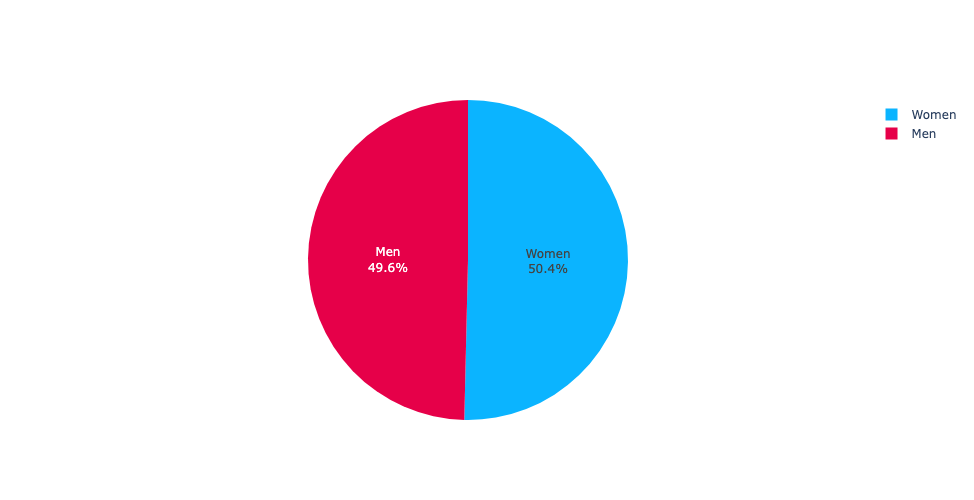

I'm wondering who are this people? What they like? How their everyday live looks like? I got [Wijk- en buurtkaart 2021](https://www.cbs.nl/nl-nl/dossier/nederland-regionaal/geografische-data/wijk-en-buurtkaart-2021), constract a dataset out of it and now it's interesting, what I can get out of it?

I got [Wijk- en buurtkaart 2021](https://www.cbs.nl/nl-nl/dossier/nederland-regionaal/geografische-data/wijk-en-buurtkaart-2021), constract a dataset out of it and now it's interesting, what I can get out of it?

Let's see! First I'm gonna look at where most of the amsterdammers live?

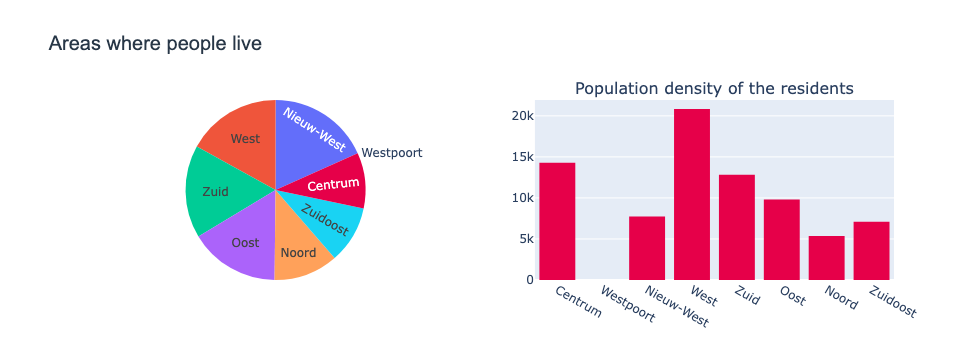

In [3]:
mannen = int(data_mensen['mannen'].sum())
vrouwen = int(data_mensen['vrouwen'].sum())

display(Markdown("In the year of 2021 in Amsterdam live {:,} people: {:,} men and {:,} women. We can see in the pie chart below, that it's 50/50%:".format(int(data_mensen['aantal_inwoners'].sum()), mannen, vrouwen)))

fig = go.Figure(data=[go.Pie(labels=['Men', 'Women'], values=[mannen, vrouwen],marker_colors=colors)])
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.update_layout(autosize=False, width=500, height=500)

fig.show()

display(Markdown("I'm wondering who are this people? What they like? How their everyday live looks like? I got [Wijk- en buurtkaart 2021](https://www.cbs.nl/nl-nl/dossier/nederland-regionaal/geografische-data/wijk-en-buurtkaart-2021), constract a dataset out of it and now it's interesting, what I can get out of it?"))
display(Markdown("I got [Wijk- en buurtkaart 2021](https://www.cbs.nl/nl-nl/dossier/nederland-regionaal/geografische-data/wijk-en-buurtkaart-2021), constract a dataset out of it and now it's interesting, what I can get out of it?"))
display(Markdown("Let's see! First I'm gonna look at where most of the amsterdammers live?"))


specs = [[{'type':'pie'}, {"type": "bar"}]]

fig = make_subplots(rows=1, cols=2, specs=specs, shared_yaxes = True,subplot_titles=['',
                                                                                     'Population density of the residents'])
                    
                    

fig.add_trace(go.Pie(labels=data_mensen['stadsdeel'], values=data_mensen['aantal_inwoners'], 
                     marker_colors=colors), 1, 1)  

fig.update_traces(textinfo='label')
fig.add_trace(go.Histogram(
    histfunc = 'avg',
    x = data_mensen['stadsdeel'],
    y = data_mensen['bevolkingsdichtheid_inwoners_per_km2'],
    marker_color = colors[0]
),1,2)

fig.update_layout(showlegend=False, 
                  title=dict(text="Areas where people live",
                             font=dict(
                                        family="Arial",
                                        size=20,
                                        color='#283747')
                    ))  
fig.show()


So it looks like most of the residents live in a districts, like Nieuw-West, Oost and West af Amsterdam, but the most crowded areas is West and Centrum.

Now I will see how people distributed over ages in different areas and in the city overall

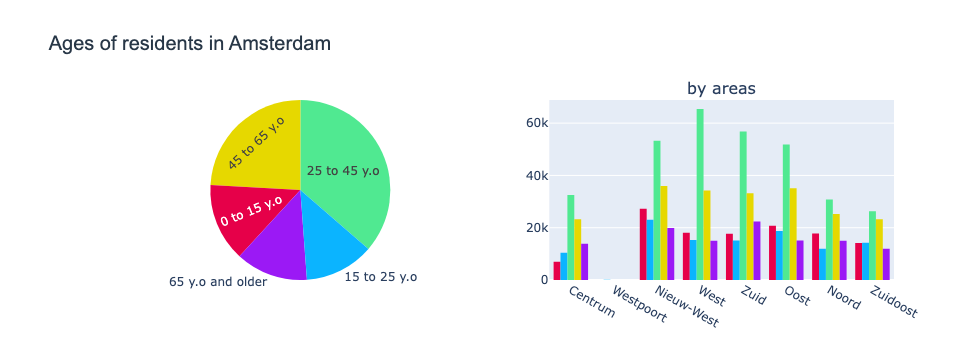

In [4]:
display(Markdown("So it looks like most of the residents live in a districts, like Nieuw-West, Oost and West af Amsterdam, but the most crowded areas is West and Centrum."))

display(Markdown("Now I will see how people distributed over ages in different areas and in the city overall"))


ages = [int(data_mensen['personen_0_tot_15_jaar'].sum()) , 
        int(data_mensen['personen_15_tot_25_jaar'].sum()), 
        int(data_mensen['personen_25_tot_45_jaar'].sum()), 
        int(data_mensen['personen_45_tot_65_jaar'].sum()), 
        int(data_mensen['personen_65_jaar_en_ouder'].sum())]
labels_ages = ['0 to 15 y.o', '15 to 25 y.o', '25 to 45 y.o', '45 to 65 y.o', '65 y.o and older']

age_colors = {labels_ages[0]:colors[0], 
                labels_ages[1]:colors[1], 
                labels_ages[2]:colors[2], 
                labels_ages[3]:colors[3], 
                labels_ages[4]:colors[4]}

specs = [[{'type':'pie'}, {"type": "bar"}]]

status_colors = {}
fig = make_subplots(rows=1, cols=2, specs = specs, shared_yaxes = True,subplot_titles=['',
                                                                                     'by areas'])

fig.add_trace(go.Pie(labels = labels_ages, values = ages, marker_colors=colors), 1, 1)  
              
fig.update_traces(textinfo='label')
fig.add_trace(go.Histogram(
    histfunc = 'sum',
    x = data_mensen['stadsdeel'],
    y = data_mensen['personen_0_tot_15_jaar'],
    name=labels_ages[0],
    marker_color=colors[0]
),1,2)
fig.add_trace(go.Histogram(
    histfunc = 'sum',
    x = data_mensen['stadsdeel'],
    y = data_mensen['personen_15_tot_25_jaar'],
    name=labels_ages[1],
    marker_color=colors[1]
),1,2)
fig.add_trace(go.Histogram(
    histfunc = 'sum',
    x = data_mensen['stadsdeel'],
    y = data_mensen['personen_25_tot_45_jaar'],
    name=labels_ages[2],
    marker_color=colors[2]
),1,2)
fig.add_trace(go.Histogram(
    histfunc = 'sum',
    x = data_mensen['stadsdeel'],
    y = data_mensen['personen_45_tot_65_jaar'],
    name=labels_ages[3],
    marker_color=colors[3]
),1,2)
fig.add_trace(go.Histogram(
    histfunc = 'sum',
    x = data_mensen['stadsdeel'],
    y = data_mensen['personen_65_jaar_en_ouder'],
    name=labels_ages[4],
    marker_color=colors[4]
),1,2)

fig.update_layout(showlegend=False, 
                  title=dict(text="Ages of residents in Amsterdam",
                             font=dict(
                                        family="Arial",
                                        size=20,
                                        color='#283747')
                    ))  
fig.show()




and what's about their marutal status?

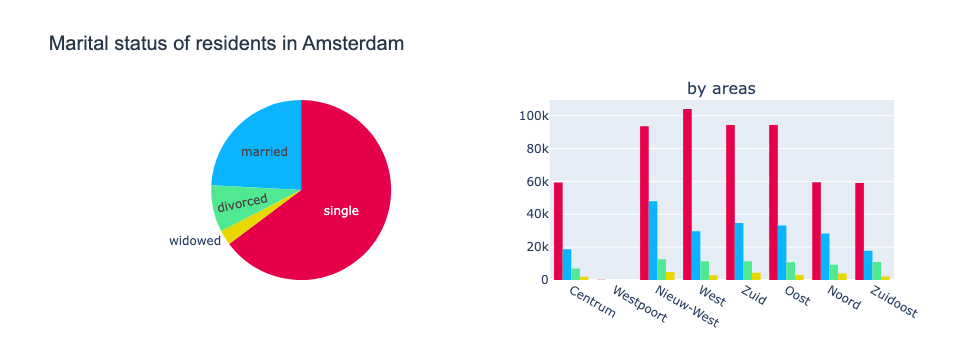

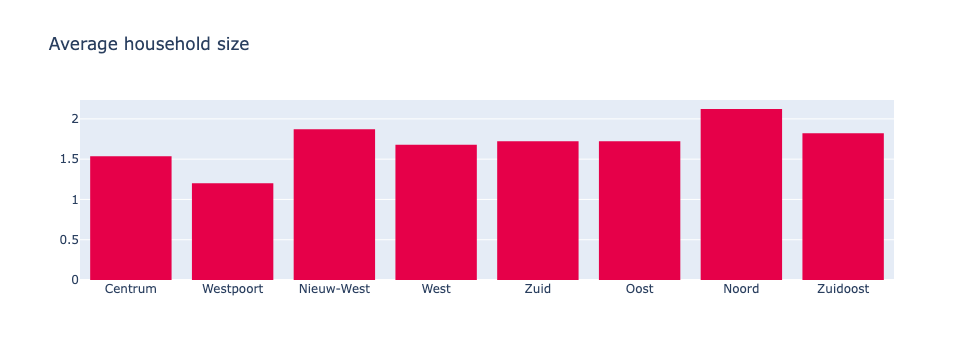

In [5]:
display(Markdown("and what's about their marutal status?"))

marriage = [int(data_mensen['personen_ongehuwd'].sum()) , 
        int(data_mensen['personen_gehuwd'].sum()), 
        int(data_mensen['personen_gescheid'].sum()), 
        int(data_mensen['personen_verweduwd'].sum())]
labels_marriage = ['single', 'married', 'divorced', 'widowed']
status_colors = {'single':colors[0], 
                'married':colors[1],
                'divorced':colors[2],
                'widowed':colors[3]}

specs = [[{'type':'pie'}, {"type": "bar"}]]

status_colors = {}
fig = make_subplots(rows=1, cols=2, specs = specs, shared_yaxes = True,subplot_titles=['',
                                                                                     'by areas'])
def get_colors():
    return colors#pd.Series(labels_marriage).map(status_colors))
fig.add_trace(go.Pie(labels = labels_marriage, values = marriage, marker_colors=get_colors()), 1, 1)  
              
fig.update_traces(textinfo='label')

fig.update_traces()
fig.update_layout(showlegend=False)
fig.add_trace(go.Histogram(
    histfunc = 'sum',
    x = data_mensen['stadsdeel'],
    y = data_mensen['personen_ongehuwd'],
    name='single',
    marker_color=colors[0]
),1,2)
fig.add_trace(go.Histogram(
    histfunc = 'sum',
    x = data_mensen['stadsdeel'],
    y = data_mensen['personen_gehuwd'],
    name='married',
    marker_color=colors[1]
),1,2)
fig.add_trace(go.Histogram(
    histfunc = 'sum',
    x = data_mensen['stadsdeel'],
    y = data_mensen['personen_gescheid'],
    name='divorced',
    marker_color=colors[2]
),1,2)
fig.add_trace(go.Histogram(
    histfunc = 'sum',
    x = data_mensen['stadsdeel'],
    y = data_mensen['personen_verweduwd'],
    name='widowed',
    marker_color=colors[3]
),1,2)

fig.update_layout(showlegend=False, 
                  title=dict(text="Marital status of residents in Amsterdam",
                             font=dict(
                                        family="Arial",
                                        size=20,
                                        color='#283747')
                    ))  
fig.show()


fig = go.Figure(data=[go.Histogram(
    histfunc = 'avg',
    x = data['stadsdeel'],
    y = data['gemiddelde_huishoudsgrootte'],
    marker_color=colors[0]
)])
fig.update_layout(title_text='Average household size')  
fig.show()

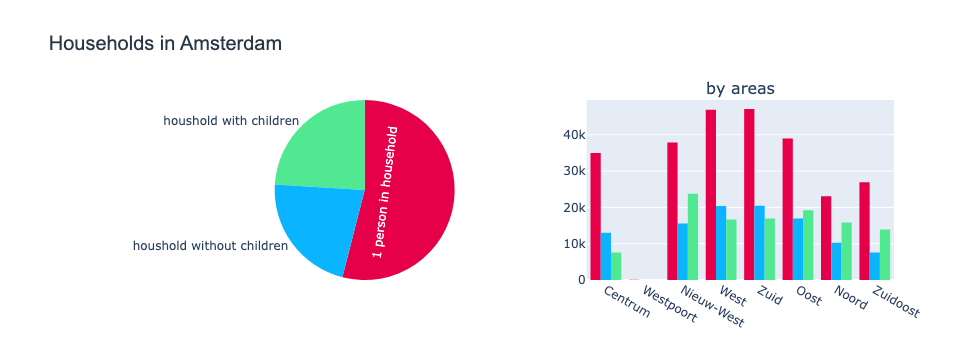

In [6]:

data_huishouden = data[['stadsdeel',
                        'aantal_huishoudens',
                        'percentage_eenpersoonshuishoudens',
                        'percentage_huishoudens_zonder_kinderen',
                        'percentage_huishoudens_met_kinderen']].copy()

data_huishouden['eenpersoonshuishoudens'] = data_huishouden.apply(lambda row: calculate_mensen(row['percentage_eenpersoonshuishoudens'], row['aantal_huishoudens']), axis=1)
data_huishouden['huishoudens_zonder_kinderen'] = data_huishouden.apply(lambda row: calculate_mensen(row['percentage_huishoudens_zonder_kinderen'], row['aantal_huishoudens']), axis=1)
data_huishouden['huishoudens_met_kinderen'] = data_huishouden.apply(lambda row: calculate_mensen(row['percentage_huishoudens_met_kinderen'], row['aantal_huishoudens']), axis=1)


housholds = [int(data_huishouden['eenpersoonshuishoudens'].sum()) , 
        int(data_huishouden['huishoudens_zonder_kinderen'].sum()), 
        int(data_huishouden['huishoudens_met_kinderen'].sum())]
labels_housholds = ['1 person in household', 'houshold without children', 'houshold with children']

age_colors = {labels_housholds[0]:colors[0], 
                labels_housholds[1]:colors[1], 
                labels_housholds[2]:colors[2]}

specs = [[{'type':'pie'}, {'type': 'bar'}]]

status_colors = {}
fig = make_subplots(rows=1, cols=2, specs = specs, shared_yaxes = True,subplot_titles=['',
                                                                                     'by areas'])

fig.add_trace(go.Pie(labels = labels_housholds, values = housholds, marker_colors=colors), 1, 1)  
              
fig.update_traces(textinfo='label')
fig.add_trace(go.Histogram(
    histfunc = 'sum',
    x = data_huishouden['stadsdeel'],
    y = data_huishouden['eenpersoonshuishoudens'],
    name=labels_housholds[0],
    marker_color=colors[0]
),1,2)
fig.add_trace(go.Histogram(
    histfunc = 'sum',
    x = data_huishouden['stadsdeel'],
    y = data_huishouden['huishoudens_zonder_kinderen'],
    name=labels_housholds[1],
    marker_color=colors[1]
),1,2)
fig.add_trace(go.Histogram(
    histfunc = 'sum',
    x = data_huishouden['stadsdeel'],
    y = data_huishouden['huishoudens_met_kinderen'],
    name=labels_housholds[2],
    marker_color=colors[2]
),1,2)

fig.update_layout(showlegend=False, 
                  title=dict(text="Households in Amsterdam",
                             font=dict(
                                        family="Arial",
                                        size=20,
                                        color='#283747')
                    ))  
fig.show()


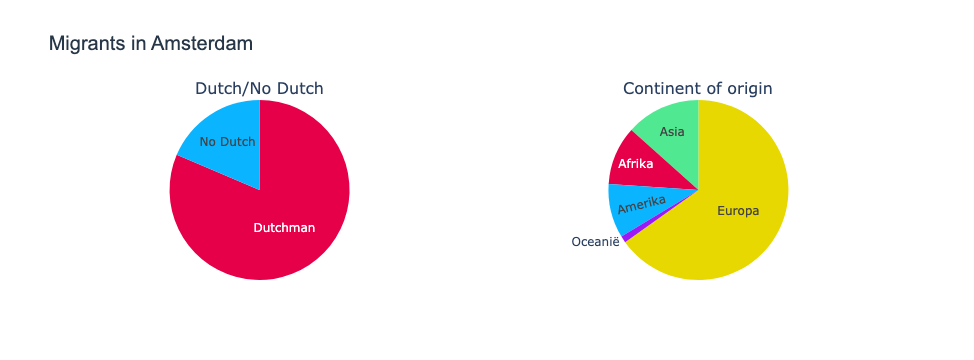

In [7]:
data_migration = pd.read_csv("amsterdamers_nationaliteit.csv") 
total_nederlanders = data_migration[data_migration['NationaliteitId'] == 'NAT9267']['Bevolking_1'].iloc[0]
total_niet_nederlanders = data_migration[data_migration['NationaliteitId'] == 'NAT9489']['Bevolking_1'].iloc[0]
total_afrika = data_migration[data_migration['NationaliteitId'] == 'NAT9269']['Bevolking_1'].iloc[0]
total_Amerika = data_migration[data_migration['NationaliteitId'] == 'NAT9270']['Bevolking_1'].iloc[0]
total_Azië = data_migration[data_migration['NationaliteitId'] == 'NAT9271']['Bevolking_1'].iloc[0]
total_Europa = data_migration[data_migration['NationaliteitId'] == 'NAT9272']['Bevolking_1'].iloc[0]
total_Oceanië = data_migration[data_migration['NationaliteitId'] == 'NAT9274']['Bevolking_1'].iloc[0]


specs = [[{'type':'pie'}, {"type": "pie"}]]

status_colors = {}
fig = make_subplots(rows=1, cols=2, specs = specs, shared_yaxes = True,subplot_titles=['Dutch/No Dutch',
                                                                                     'Continent of origin'])

fig.add_trace(go.Pie(labels = ['Dutchman','No Dutch'], values = [total_nederlanders, total_niet_nederlanders], marker_colors=colors), 1, 1)  
              
fig.add_trace(go.Pie(labels = ['Afrika','Amerika', 'Asia', 'Europa', 'Oceanië'], 
                     values = [total_afrika, 
                              total_Amerika,
                              total_Azië,
                              total_Europa,
                              total_Oceanië], marker_colors=colors), 1, 2)  


fig.update_layout(showlegend = False, 
                  title=dict(text="Migrants in Amsterdam",
                             font=dict(
                                        family="Arial",
                                        size=20,
                                        color='#283747')
                    ))  
fig.update_traces(textinfo='label')
fig.show()

In [8]:
id_to_remove = ['T001059', 'NAT9489','NAT9267','NAT9269', 'NAT9270', 'NAT9271', 'NAT9272', 'NAT9274', 'NAT9275', 'NAT9277', 'NAT9481', 'NAT9482', 'NAT9483']

migrants_from_countries = data_migration.loc[~data_migration['NationaliteitId'].isin(id_to_remove)]

print(migrants_from_countries.shape)
migrants_from_countries.head()

(32, 3)


,NationaliteitId,Nationaliteit,Bevolking_1
13,NAT9281,Amerikaans,7506
14,NAT9292,Belgisch,2862
15,NAT9300,Braziliaans,2568
16,NAT9301,Brits,12881
17,NAT9303,Bulgaars,5138


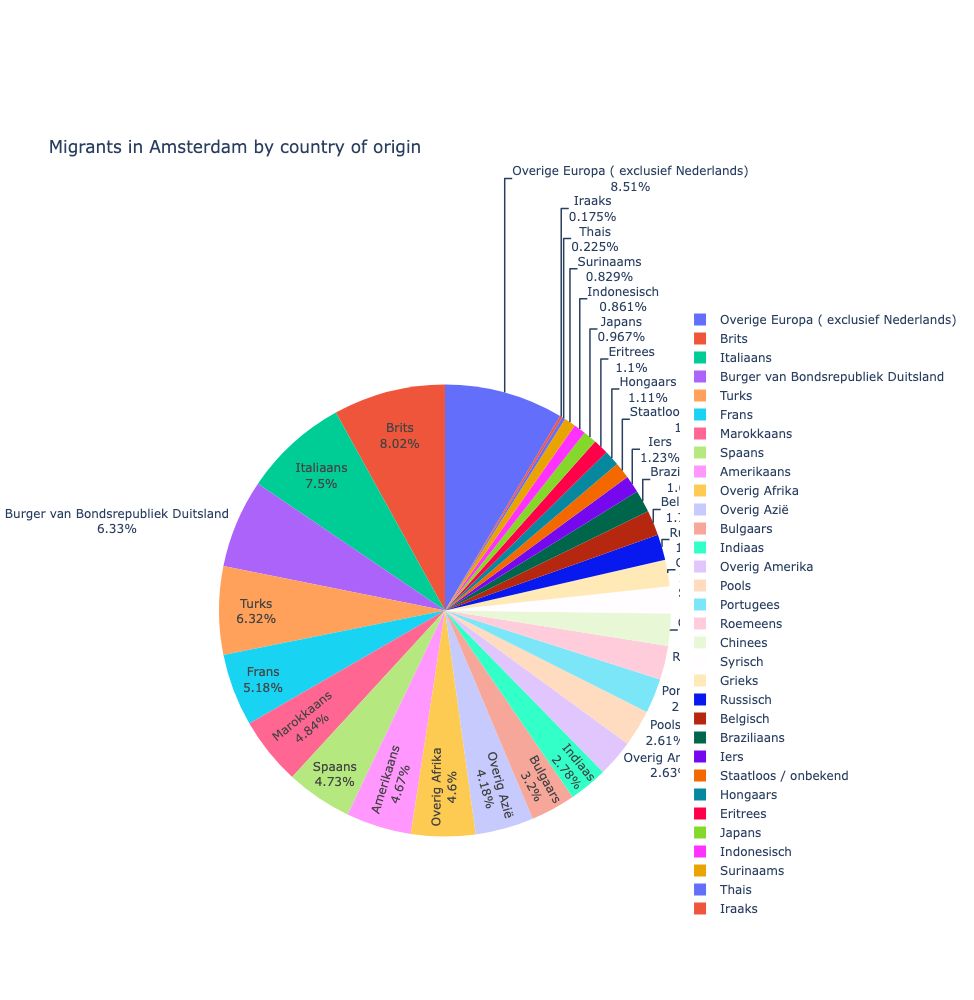

In [9]:

fig = px.pie(migrants_from_countries, values='Bevolking_1', names='Nationaliteit',
             title='Migrants in Amsterdam by country of origin',
             hover_data=['Bevolking_1'])
fig.update_layout(autosize=False, width=1000, height=1000)
fig.update_traces(textinfo='percent+label')
fig.show()

<AxesSubplot: title={'center': 'Correlation of numeric factors'}>

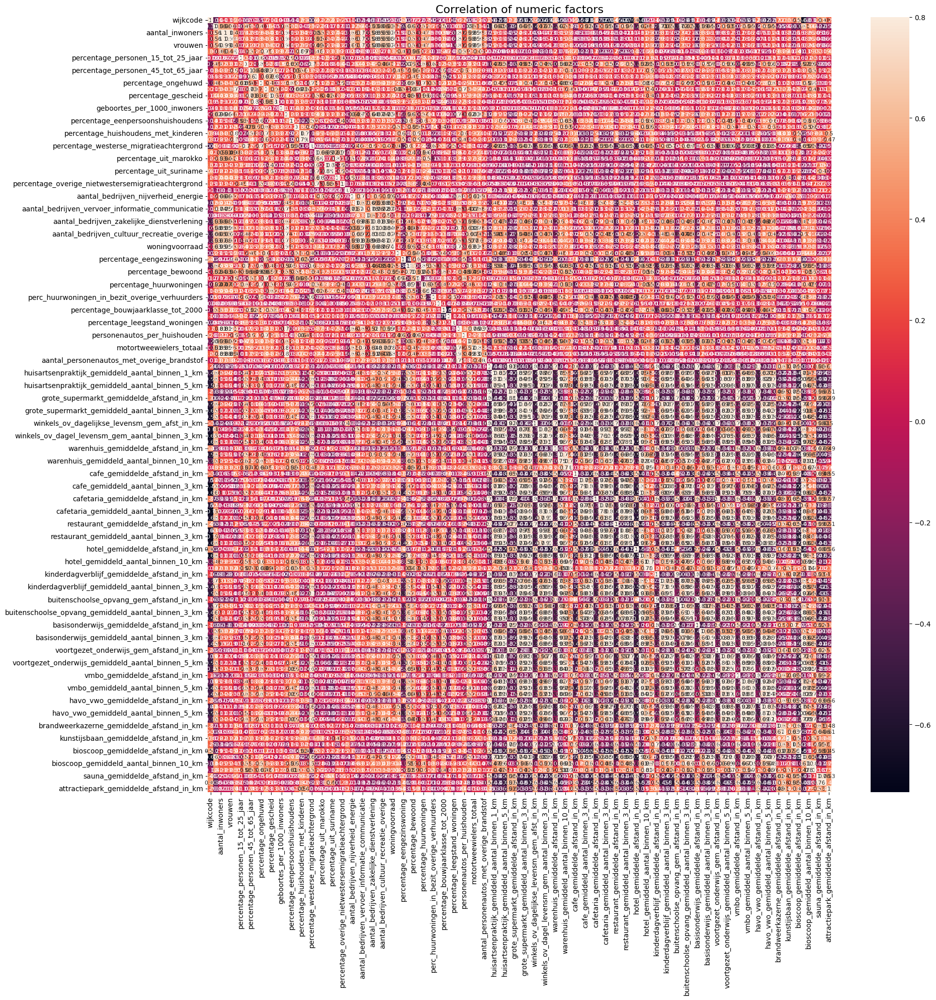

In [10]:
import matplotlib.pyplot as plt
import seaborn as sns

numeric_data = data.select_dtypes(include=[np.number])

corr_matrix = numeric_data.corr()
f, ax = plt.subplots(figsize = (20,20))
plt.title('Correlation of numeric factors', y = 1, size = 16)
sns.heatmap(corr_matrix, vmax = .8, annot_kws={'size': 8}, annot = True)

In [11]:
def print_highly_correlated(df, features, threshold=0.7):
    """Prints highly correlated features pairs in the data frame (helpful for feature engineering)"""
    corr_df = df[features].corr()
    correlated_features = np.where(np.abs(corr_df) > threshold) # select ones above the abs threshold
    correlated_features = [(corr_df.iloc[x,y], x, y) for x, y in zip(*correlated_features) if x != y and x < y] # avoid duplication
    s_corr_list = sorted(correlated_features, key=lambda x: -abs(x[0])) # sort by correlation value
    if s_corr_list == []:
        print("There are no highly correlated features with correlation above", threshold)
    else:
        
        for v, i, j in s_corr_list:
            cols = df[features].columns
            print ("%s and %s = %.3f" % (corr_df.index[i], corr_df.columns[j], v))

            


In [12]:
columns = [ column for column in numeric_data.columns if "_binnen_" not in column ]
columns = [ column for column in columns if "percentage_" not in column ]
#print_highly_correlated(numeric_data, columns)

In [13]:
#data.columns.to_list()

In [14]:
On whih distance

SyntaxError: invalid syntax (2203305704.py, line 1)

In [ ]:
#sns.pairplot(data = data, x_vars = ['dogs_amount'], y_vars = columns)

In [ ]:
#sns.relplot(data=data, x="personenautos_totaal", y="aantal_huishoudens", hue="Stadsdeel")